Pretty much all of the code in this notebook was heavily assisted by Perplexity and GPT-4o

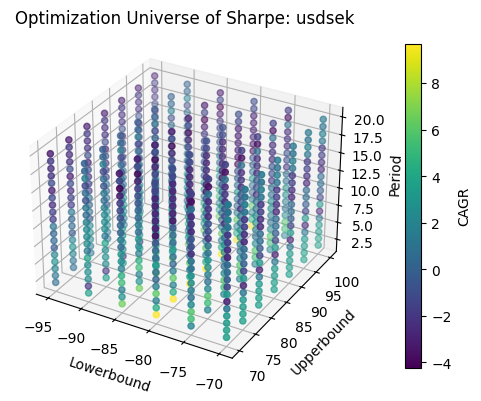

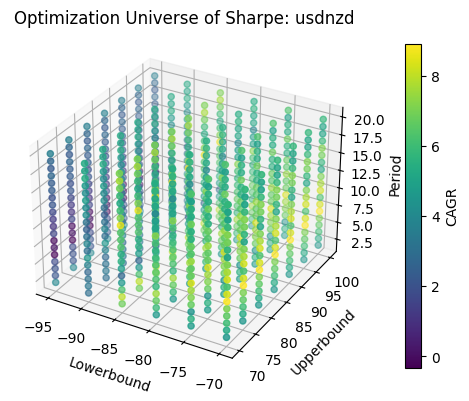

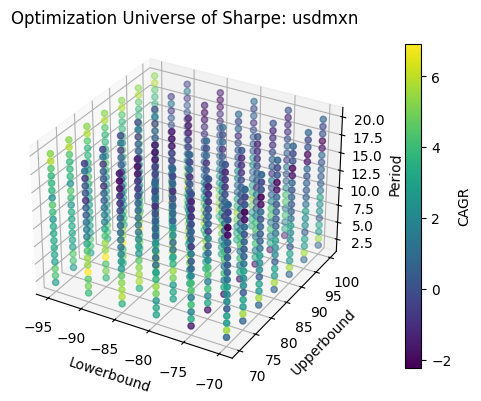

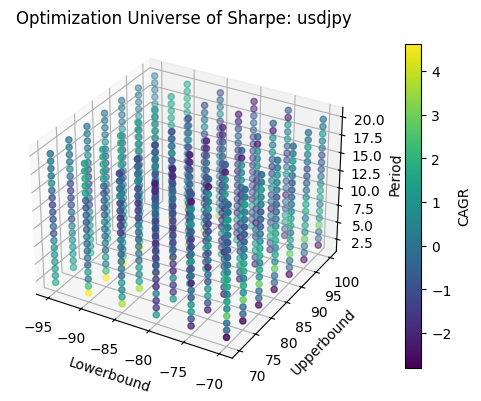

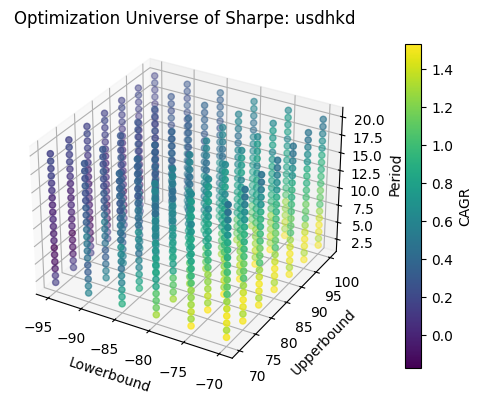

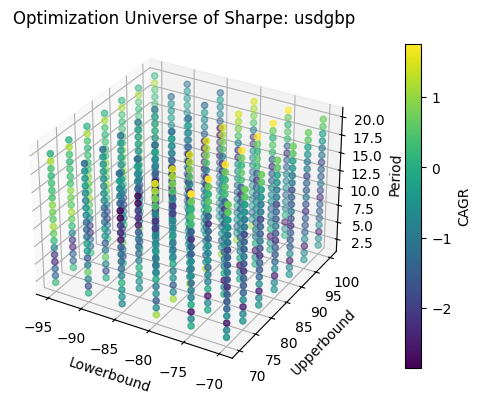

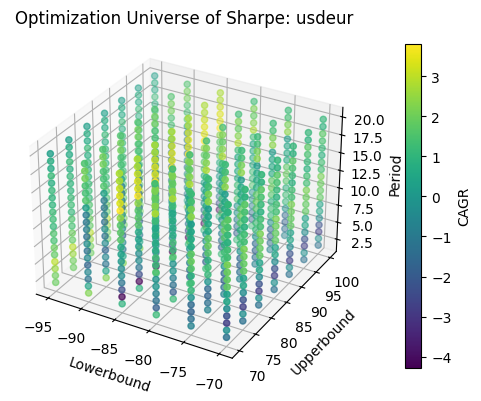

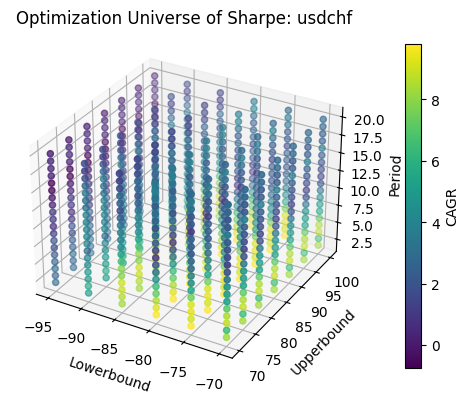

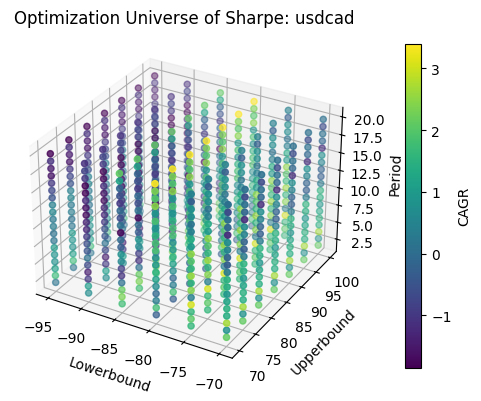

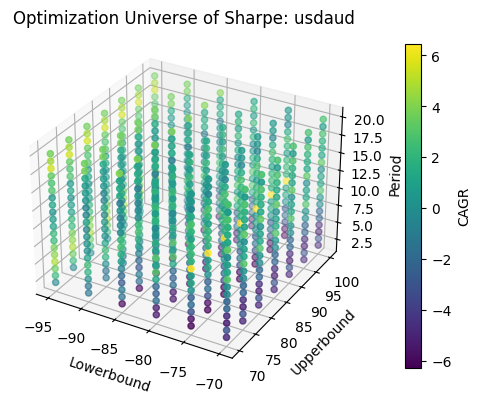

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import os

def plot_4d_from_csv(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Extract columns
    x = data["lowerband"]
    y = data["upperband"]
    z = data["period"]
    c = data["returns.cagr"]
    category = data["symbol"]

    # Get unique categories
    unique_categories = category.unique()

    output_folder = os.path.join(os.path.dirname(file_path), "Optimization_Universes")
    os.makedirs(output_folder, exist_ok=True)

    # Create a 3D plot for each category
    for cat in unique_categories:
        fig = plt.figure(figsize=(6, 6), dpi=100)
        ax = fig.add_subplot(111, projection='3d')
        
        # Filter data for the current category
        cat_mask = category == cat
        
        # Plot the data
        scatter = ax.scatter(x[cat_mask], y[cat_mask], z[cat_mask], c=c[cat_mask], cmap='viridis')
        
        # Add color bar with adjusted size and position
        cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', shrink=0.7, pad=0.1)  # Adjust shrink and pad
        cbar.set_label('CAGR')

        # Set labels and title
        ax.set_xlabel('Lowerbound')
        ax.set_ylabel('Upperbound')
        ax.set_zlabel('Period')
        ax.set_title(f'Optimization Universe of Sharpe: {cat}')

        output_file = os.path.join(output_folder, f"{cat}_williamscagr_optimization_universe.png")
        plt.savefig(output_file)

        plt.show()

# Example usage
plot_4d_from_csv('Reports/williamscagr/optimization_results.csv')

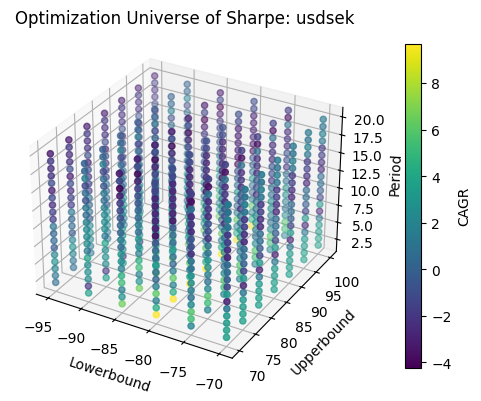

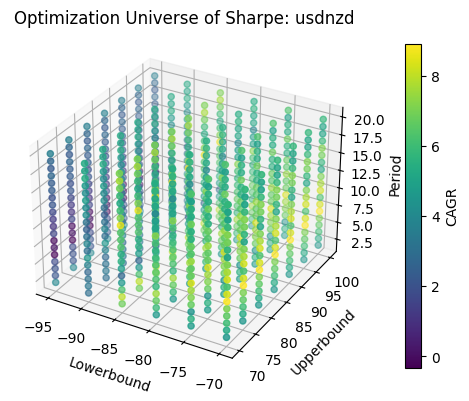

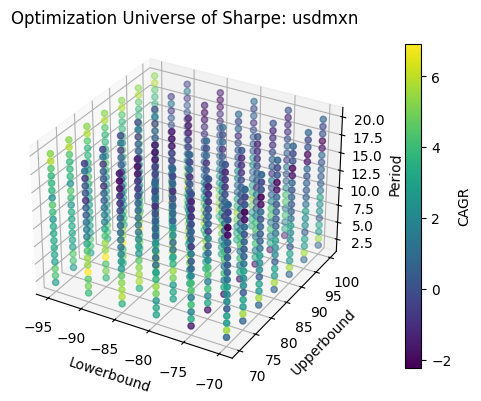

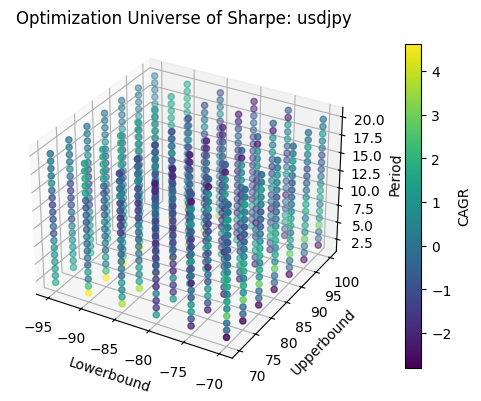

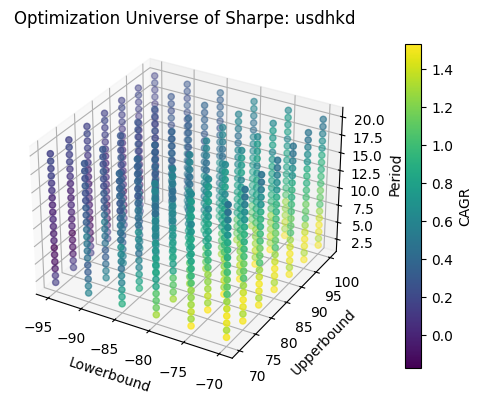

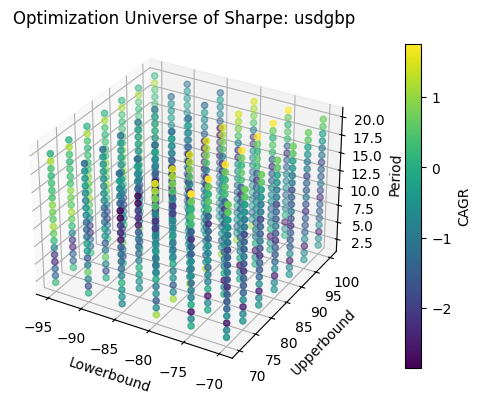

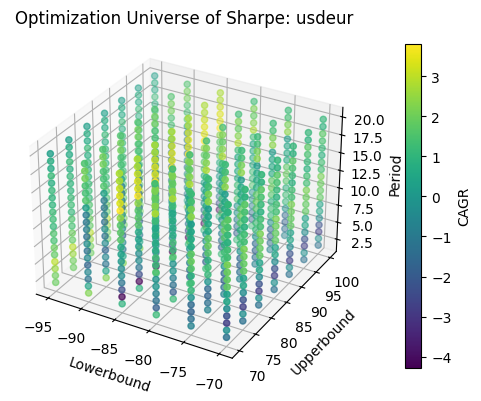

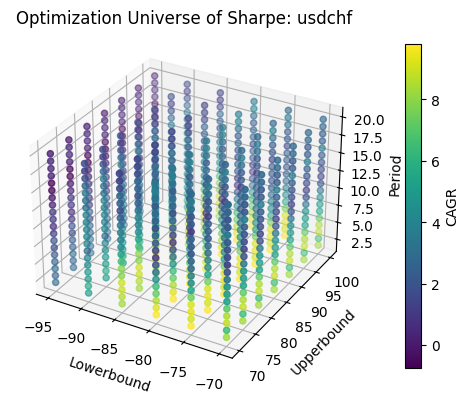

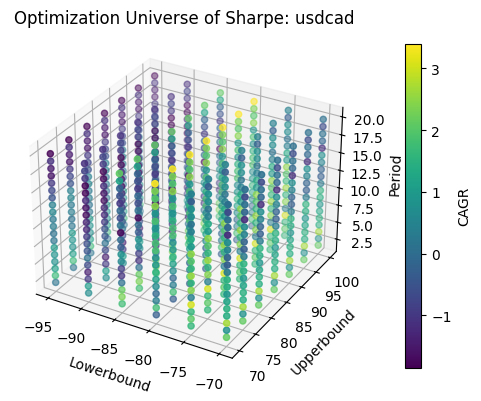

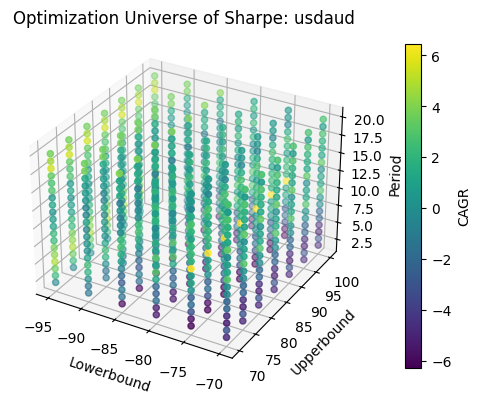

In [61]:
def plot_4d_from_csv(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Extract columns
    x = data["lowerband"]
    y = data["upperband"]
    z = data["period"]
    c = data["returns.cagr"]
    category = data["symbol"]

    # Get unique categories
    unique_categories = category.unique()

    output_folder = os.path.join(os.path.dirname(file_path), "Optimization_Universes")
    os.makedirs(output_folder, exist_ok=True)

    # Create a 3D plot for each category
    for cat in unique_categories:
        fig = plt.figure(figsize=(6, 6), dpi=100)
        ax = fig.add_subplot(111, projection='3d')
        
        # Filter data for the current category
        cat_mask = category == cat
        
        # Plot the data
        scatter = ax.scatter(x[cat_mask], y[cat_mask], z[cat_mask], c=c[cat_mask], cmap='viridis')
        
        # Add color bar with adjusted size and position
        cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', shrink=0.7, pad=0.1)  # Adjust shrink and pad
        cbar.set_label('CAGR')

        # Set labels and title
        ax.set_xlabel('Lowerbound')
        ax.set_ylabel('Upperbound')
        ax.set_zlabel('Period')
        ax.set_title(f'Optimization Universe of Sharpe: {cat}')

        output_file = os.path.join(output_folder, f"{cat}_williamsharpe_optimization_universe.png")
        plt.savefig(output_file)

        plt.show()

# Example usage
plot_4d_from_csv('Reports/williamssharpe/optimization_results.csv')

Avg Profit:  1.5331296750016465


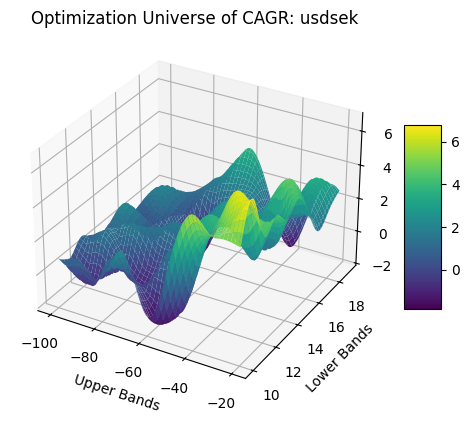

Avg Profit:  5.811382361666586


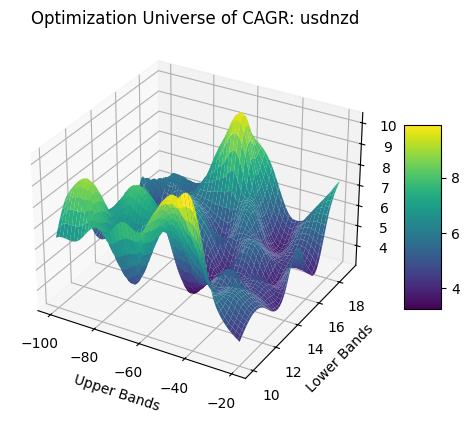

Avg Profit:  -1.208105494305016


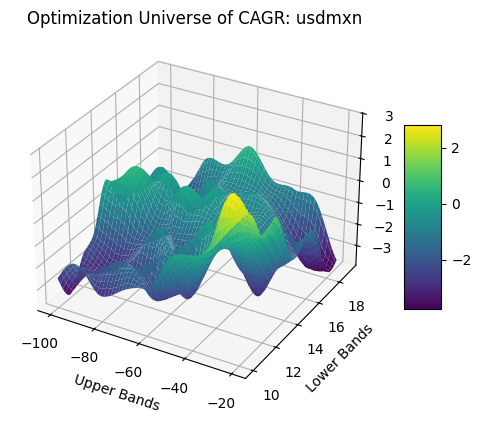

Avg Profit:  0.8604583062395708


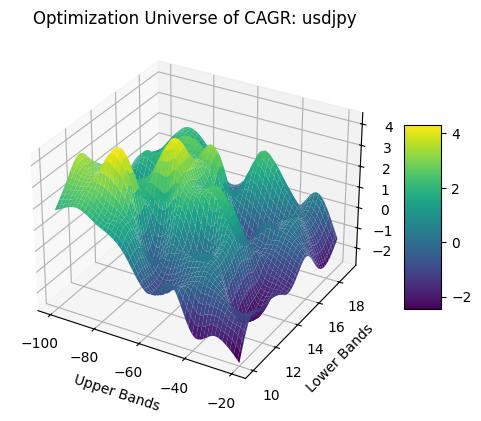

Avg Profit:  0.25857366069191023


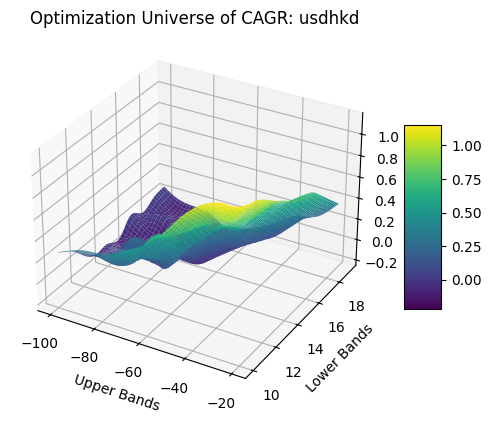

Avg Profit:  0.3829274309653298


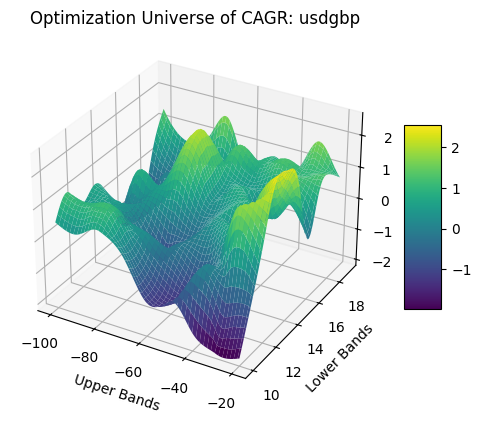

Avg Profit:  0.962200034169585


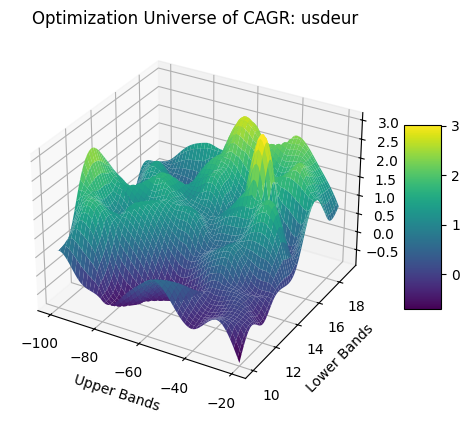

Avg Profit:  3.5017131014334475


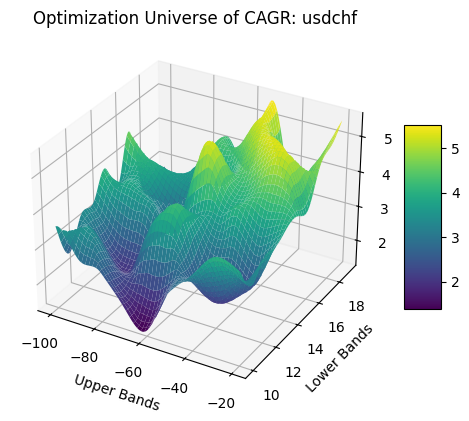

Avg Profit:  2.46526763825891


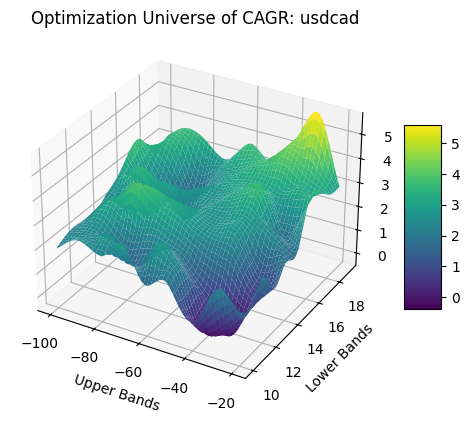

Avg Profit:  2.8634583479403704


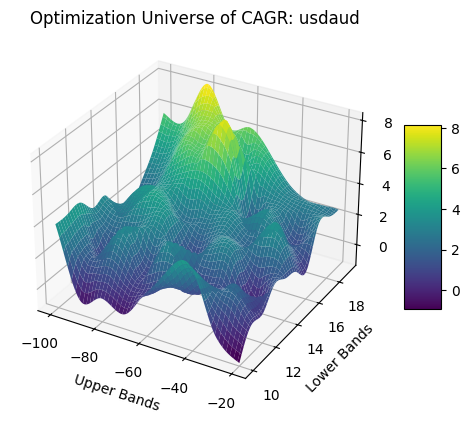

In [ ]:
from scipy.interpolate import griddata
import numpy as np

def plot_4d_from_csv(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Extract columns
    x = data["lowerband"]
    y = data["period"]
    z = data["returns.cagr"]
    category = data["symbol"]

    # Get unique categories
    unique_categories = category.unique()

    output_folder = os.path.join(os.path.dirname(file_path), "Optimization_Universes")
    os.makedirs(output_folder, exist_ok=True)

    # Create a 3D plot for each category
    for cat in unique_categories:
      
      cat_mask = category == cat
      lowerbounds = x[cat_mask]
      periods = y[cat_mask]
      profits = z[cat_mask]

      grid_x, grid_y = np.meshgrid(
          np.linspace(min(lowerbounds), max(lowerbounds), 100),
          np.linspace(min(periods), max(periods), 100)
      )

      # Interpolate Z values (profit) for the grid
      grid_z = griddata((lowerbounds, periods), profits, (grid_x, grid_y), method='cubic')
      flattened_array = [item for sublist in grid_z for item in sublist]
      
      print("Avg Profit: ", sum(flattened_array) / len(flattened_array))

      # Create a figure and 3D axis
      fig = plt.figure()
      ax = fig.add_subplot(111, projection='3d')

      # Plot the surface
      surf = ax.plot_surface(grid_x, grid_y, grid_z, cmap='viridis', edgecolor='none')

      # Add color bar for heatmap
      fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

      # Labels
      ax.set_title(f'Optimization Universe of CAGR: {cat}')
      ax.set_xlabel('Upper Bands')
      ax.set_ylabel('Lower Bands')
      ax.set_zlabel('Profit')

      output_file = os.path.join(output_folder, f"{cat}_ccicagr_optimization_universe.png")
      plt.savefig(output_file)

      # Show the plot
      plt.show()

# Example usage
plot_4d_from_csv('Reports/ccicagr/optimization_results.csv')

Avg Profit:  1.5331296750016465


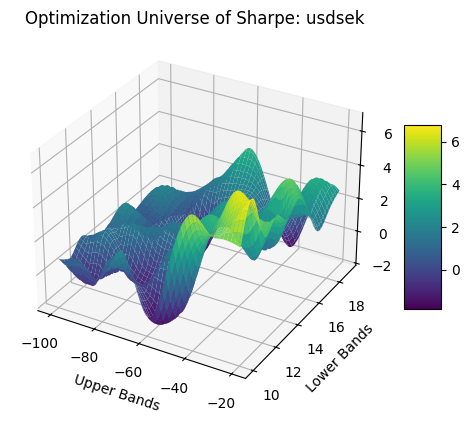

Avg Profit:  5.811382361666586


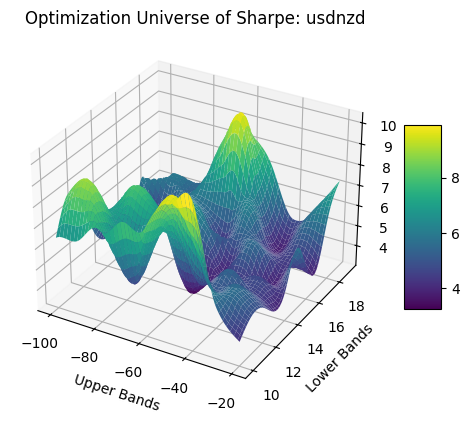

Avg Profit:  -1.208105494305016


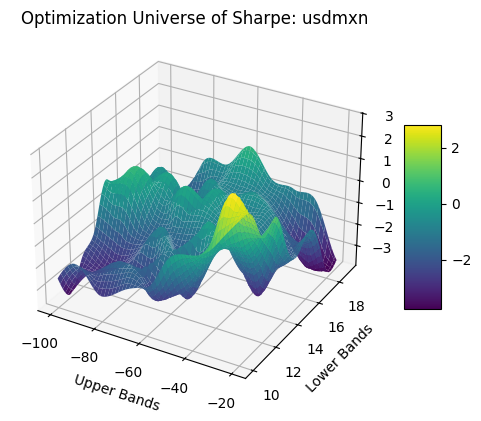

Avg Profit:  0.8604583062395708


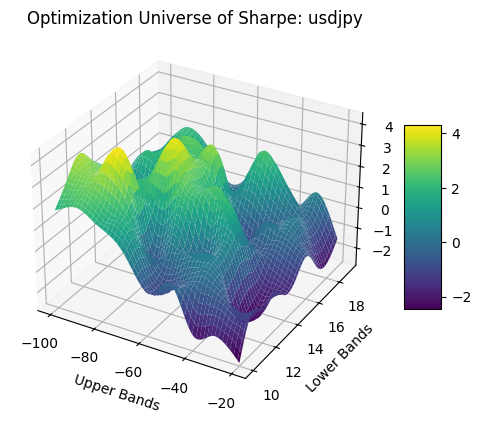

Avg Profit:  0.25857366069191023


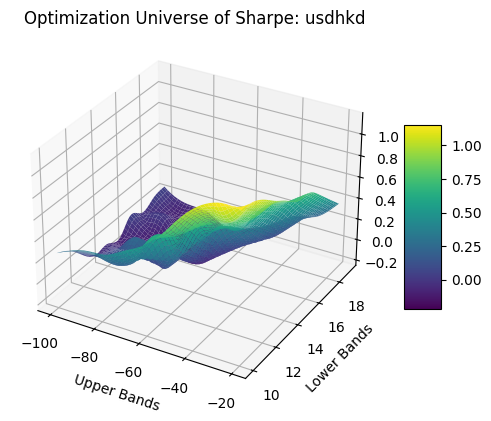

Avg Profit:  0.3829274309653298


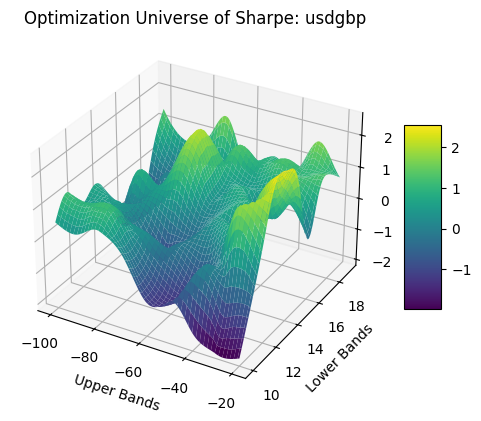

Avg Profit:  0.962200034169585


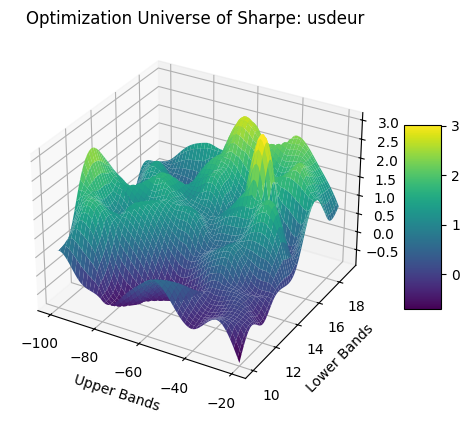

Avg Profit:  3.5017131014334475


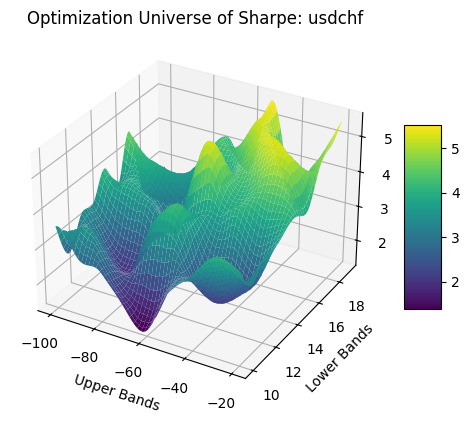

Avg Profit:  2.46526763825891


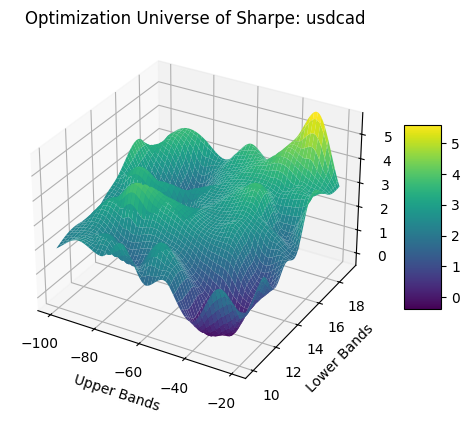

Avg Profit:  2.8634583479403704


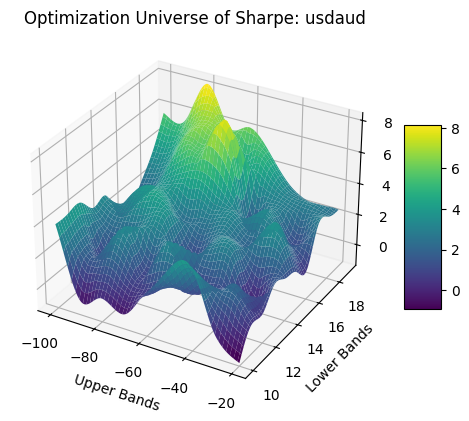

In [63]:
from scipy.interpolate import griddata
import numpy as np

def plot_4d_from_csv(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Extract columns
    x = data["lowerband"]
    y = data["period"]
    z = data["returns.cagr"]
    category = data["symbol"]

    # Get unique categories
    unique_categories = category.unique()

    output_folder = os.path.join(os.path.dirname(file_path), "Optimization_Universes")
    os.makedirs(output_folder, exist_ok=True)

    # Create a 3D plot for each category
    for cat in unique_categories:
      
      cat_mask = category == cat
      lowerbounds = x[cat_mask]
      periods = y[cat_mask]
      profits = z[cat_mask]

      grid_x, grid_y = np.meshgrid(
          np.linspace(min(lowerbounds), max(lowerbounds), 100),
          np.linspace(min(periods), max(periods), 100)
      )

      # Interpolate Z values (profit) for the grid
      grid_z = griddata((lowerbounds, periods), profits, (grid_x, grid_y), method='cubic')
      flattened_array = [item for sublist in grid_z for item in sublist]
      
      print("Avg Profit: ", sum(flattened_array) / len(flattened_array))

      # Create a figure and 3D axis
      fig = plt.figure()
      ax = fig.add_subplot(111, projection='3d')

      # Plot the surface
      surf = ax.plot_surface(grid_x, grid_y, grid_z, cmap='viridis', edgecolor='none')

      # Add color bar for heatmap
      fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

      # Labels
      ax.set_title(f'Optimization Universe of Sharpe: {cat}')
      ax.set_xlabel('Upper Bands')
      ax.set_ylabel('Lower Bands')
      ax.set_zlabel('Profit')

      output_file = os.path.join(output_folder, f"{cat}_ccisharpe_optimization_universe.png")
      plt.savefig(output_file)

      # Show the plot
      plt.show()

# Example usage
plot_4d_from_csv('Reports/ccisharpe/optimization_results.csv')

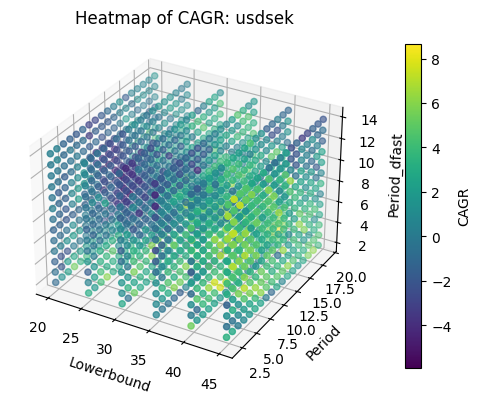

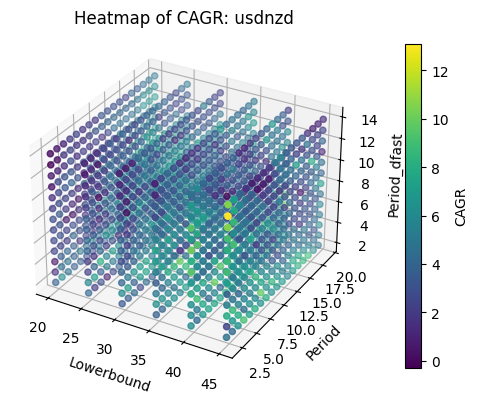

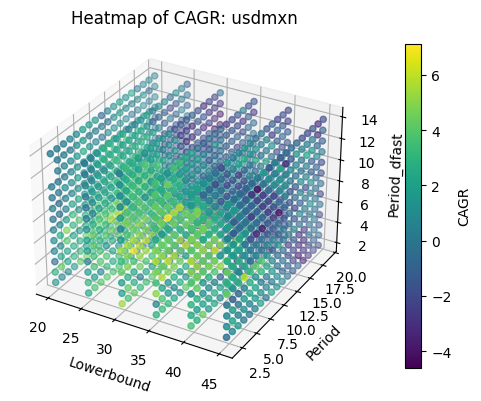

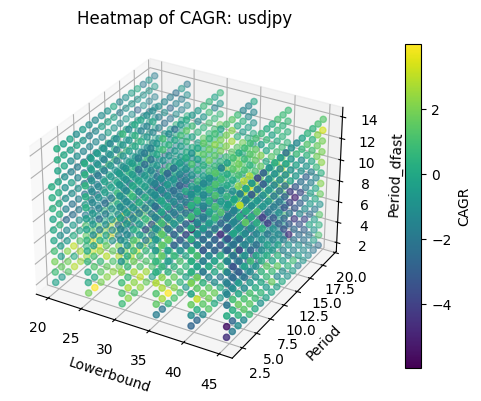

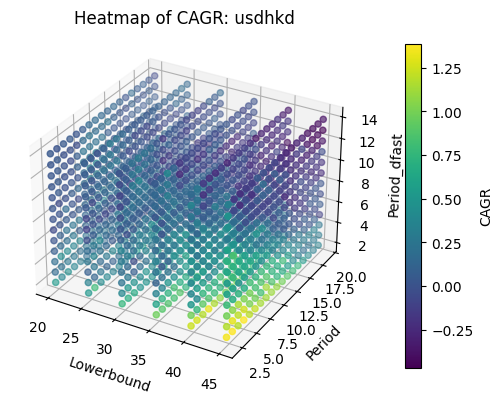

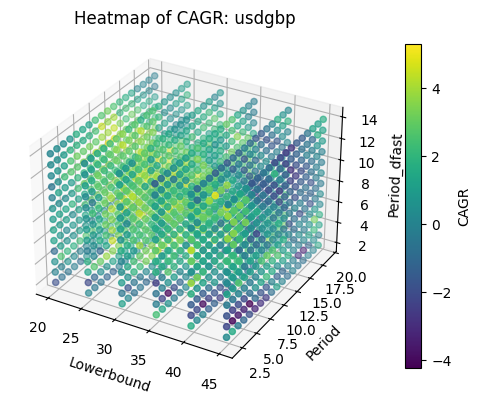

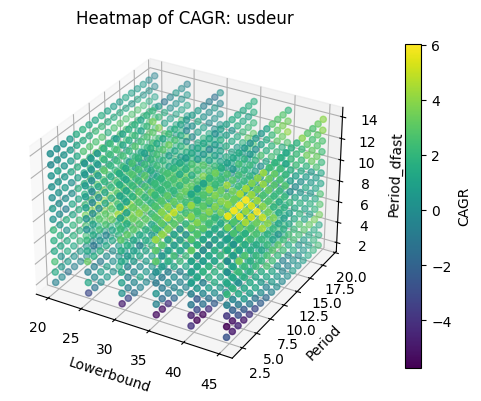

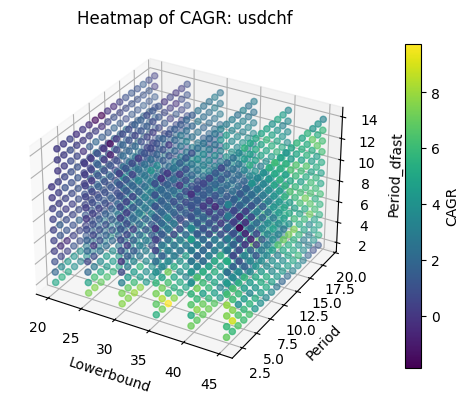

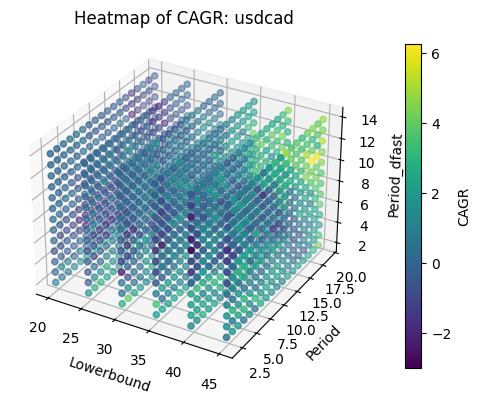

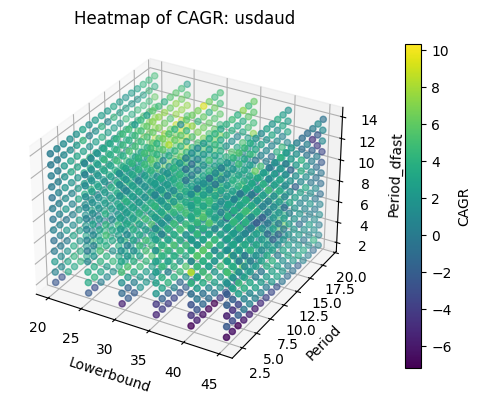

In [67]:
def plot_4d_from_csv(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Extract columns
    x = data["lowerband"]
    y = data["period"]
    z = data["period_dfast"]
    c = data["returns.cagr"]
    category = data["symbol"]

    # Get unique categories
    unique_categories = category.unique()

    output_folder = os.path.join(os.path.dirname(file_path), "Optimization_Universes")
    os.makedirs(output_folder, exist_ok=True)

    # Create a 3D plot for each category
    for cat in unique_categories:
        fig = plt.figure(figsize=(6, 6), dpi=100)
        ax = fig.add_subplot(111, projection='3d')
        
        # Filter data for the current category
        cat_mask = category == cat
        
        # Plot the data
        scatter = ax.scatter(x[cat_mask], y[cat_mask], z[cat_mask], c=c[cat_mask], cmap='viridis')
        
        # Add color bar with adjusted size and position
        cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', shrink=0.7, pad=0.1)  # Adjust shrink and pad
        cbar.set_label('CAGR')

        # Set labels and title
        ax.set_xlabel('Lowerbound')
        ax.set_ylabel('Period')
        ax.set_zlabel('Period_dfast')
        ax.set_title(f'Heatmap of CAGR: {cat}')

        output_file = os.path.join(output_folder, f"{cat}_stochasticcagr_optimization_universe.png")
        plt.savefig(output_file)

        plt.show()

# Example usage
plot_4d_from_csv('Reports/stochasticcagr/optimization_results.csv')

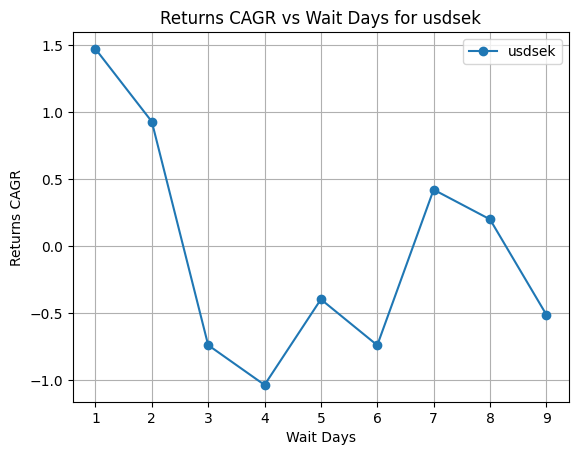

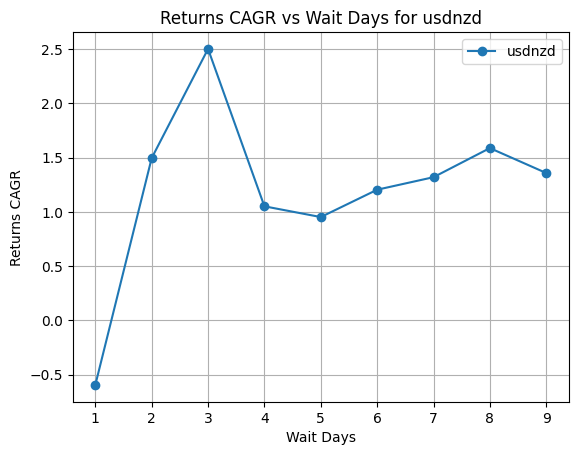

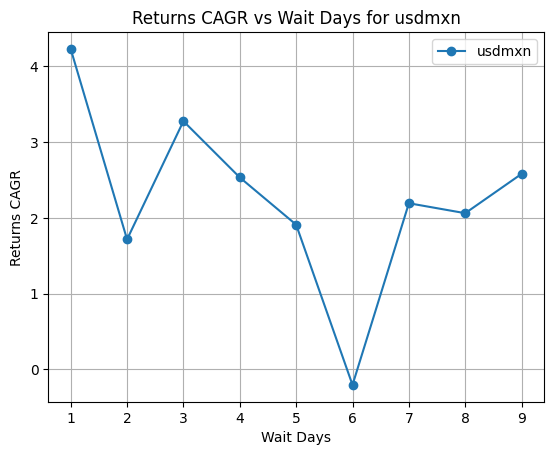

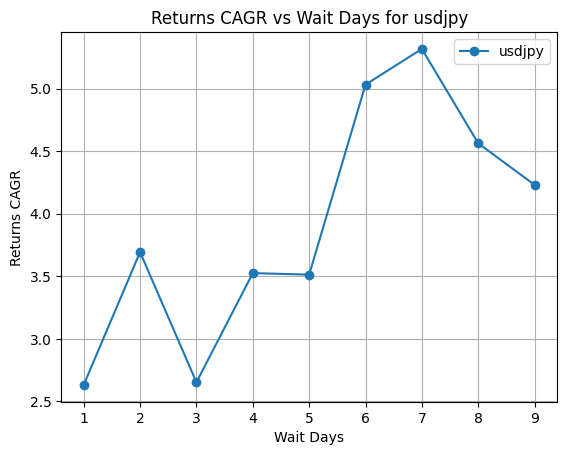

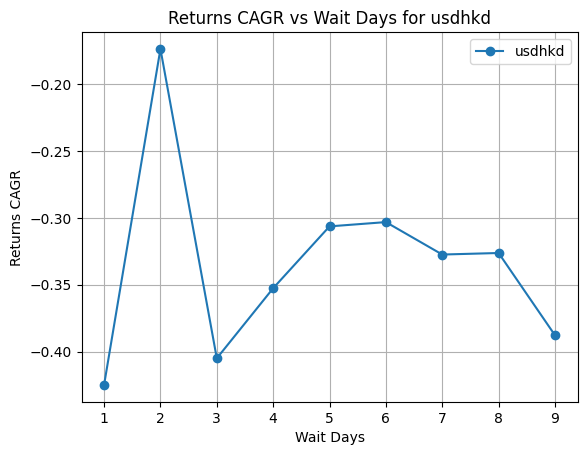

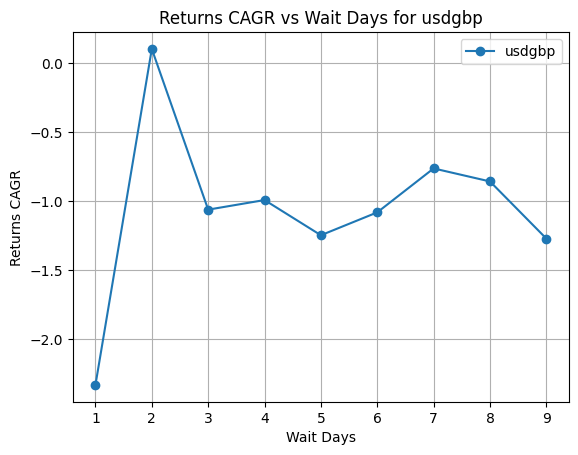

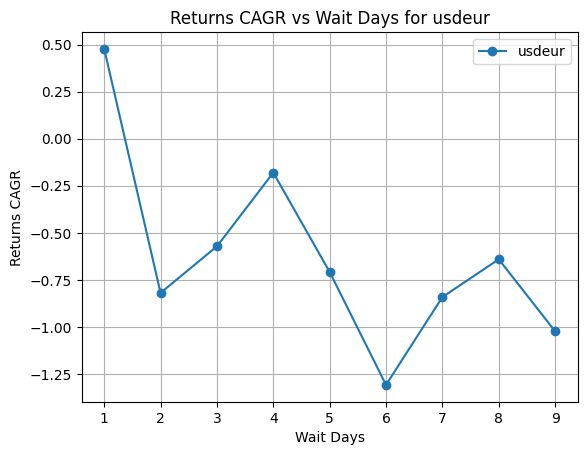

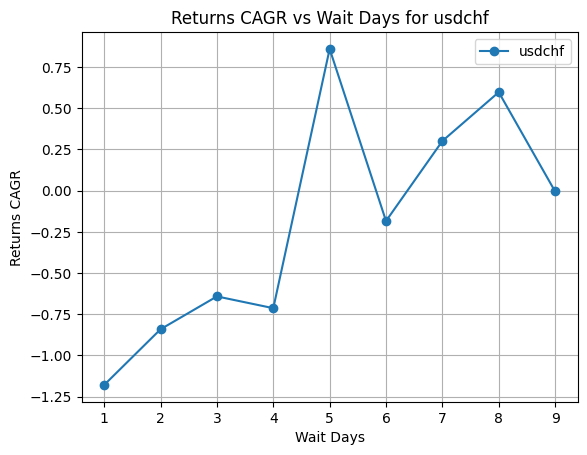

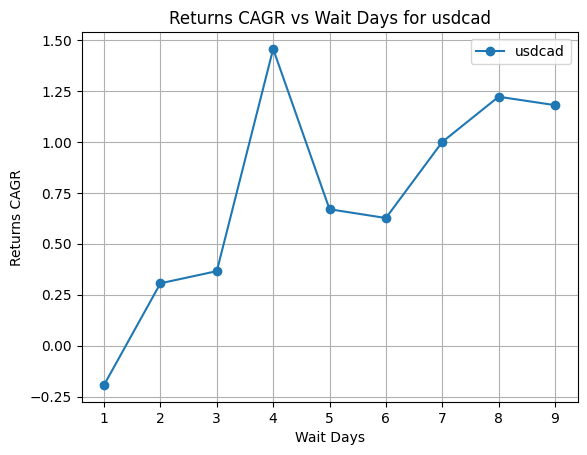

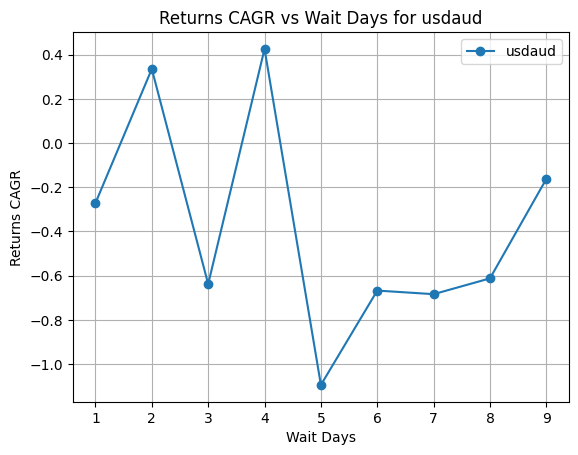

In [66]:
# Load the data from the CSV file
file_path = 'Reports/turnaroundsharpe/optimization_results.csv'
data = pd.read_csv(file_path)

# Get unique symbols
symbols = data['symbol'].unique()

output_folder = os.path.join(os.path.dirname(file_path), "Optimization_Universes")
os.makedirs(output_folder, exist_ok=True)


# Create separate plots for each symbol
for symbol in symbols:
    symbol_data = data[data['symbol'] == symbol]
    plt.figure(dpi=100)
    plt.plot(symbol_data['wait_days'], symbol_data['returns.cagr'], marker='o', linestyle='-', label=f'{symbol}')
    plt.xlabel('Wait Days')
    plt.ylabel('Returns CAGR')
    plt.title(f'Returns CAGR vs Wait Days for {symbol}')
    plt.legend()
    plt.grid()
    output_file = os.path.join(output_folder, f"{symbol}_turnaroundsharpe_optimization_universe.png")
    plt.savefig(output_file)
    plt.show()


In [78]:
def generate_latex_table(best_parameters_path, optimization_results_path, selected_headings, column_name_map):
    import pandas as pd

    # Load the datasets
    best_parameters = pd.read_csv(best_parameters_path)
    optimization_results = pd.read_csv(optimization_results_path)

    # Replace underscores in column headings with spaces
    best_parameters.columns = [col.replace("_", " ") for col in best_parameters.columns]
    optimization_results.columns = [col.replace("_", " ") for col in optimization_results.columns]

    # Filter optimization_results to include only rows matching best_parameters
    merged_results = optimization_results.merge(best_parameters, on=['symbol', 'period', "lowerband"])

    # Replace underscores in the merged results columns with spaces
    merged_results.columns = [col.replace("_", " ") for col in merged_results.columns]

    # Select only the specified headings for the table
    filtered_results = merged_results[selected_headings]

    # Rename columns based on the provided column_name_map
    filtered_results.rename(columns=column_name_map, inplace=True)

    # Generate a LaTeX table from the filtered results
    latex_table = filtered_results.to_latex(index=False, longtable=True, float_format="%.3f")
    print(latex_table)

# Execute the function with the uploaded file paths
generate_latex_table("Reports/ccicagr/best_parameters.csv",
                     "Reports/ccicagr/test_results.csv",
                     ["symbol", "period", "lowerband", 
                      "exposure.percent", "returns.cagr", "returns.sharpe ratio", 
                      "trades.total", "drawdown.max percent", "profit factor"],
                     {"symbol": "Symbol", "period": "Period", "lowerband": "Lowerband", 
                      "exposure.percent": "Exposure","returns.cagr": "CAGR", "returns.sharpe ratio": "Sharpe",
                      "trades.total": "Trades", "drawdown.max percent": "Max Drawdown", "profit factor": "Profit Factor"})


\begin{longtable}{lrrrrrrrr}
\toprule
Symbol & Period & Lowerband & Exposure & CAGR & Sharpe & Trades & Max Drawdown & Profit Factor \\
\midrule
\endfirsthead
\toprule
Symbol & Period & Lowerband & Exposure & CAGR & Sharpe & Trades & Max Drawdown & Profit Factor \\
\midrule
\endhead
\midrule
\multicolumn{9}{r}{Continued on next page} \\
\midrule
\endfoot
\bottomrule
\endlastfoot
usdsek & 10 & -20 & 41.174 & 0.335 & 0.001 & 226 & 5.538 & 1.009 \\
usdnzd & 10 & -100 & 19.751 & -4.160 & -0.016 & 113 & 5.289 & 0.784 \\
usdmxn & 10 & -20 & 42.321 & -3.440 & -0.005 & 211 & 6.978 & 0.935 \\
usdjpy & 10 & -100 & 18.532 & -9.290 & -0.026 & 103 & 7.888 & 0.632 \\
usdhkd & 10 & -20 & 46.116 & 0.232 & 0.004 & 212 & 0.616 & 1.069 \\
usdgbp & 19 & -20 & 38.980 & 4.851 & 0.018 & 268 & 2.724 & 1.210 \\
usdeur & 19 & -20 & 39.438 & 1.994 & 0.008 & 221 & 3.625 & 1.105 \\
usdchf & 19 & -20 & 41.042 & -8.373 & -0.027 & 208 & 9.061 & 0.721 \\
usdcad & 19 & -20 & 35.999 & 2.502 & 0.015 & 208 & 1.628 & 1.168

/var/folders/f7/vh_rpdgs2cq5nlwd53xmv6p00000gn/T/ipykernel_91431/517726574.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_results.rename(columns=column_name_map, inplace=True)


Backtesting Best Parameters: 100%|██████████| 10/10 [00:02<00:00,  4.58it/s]


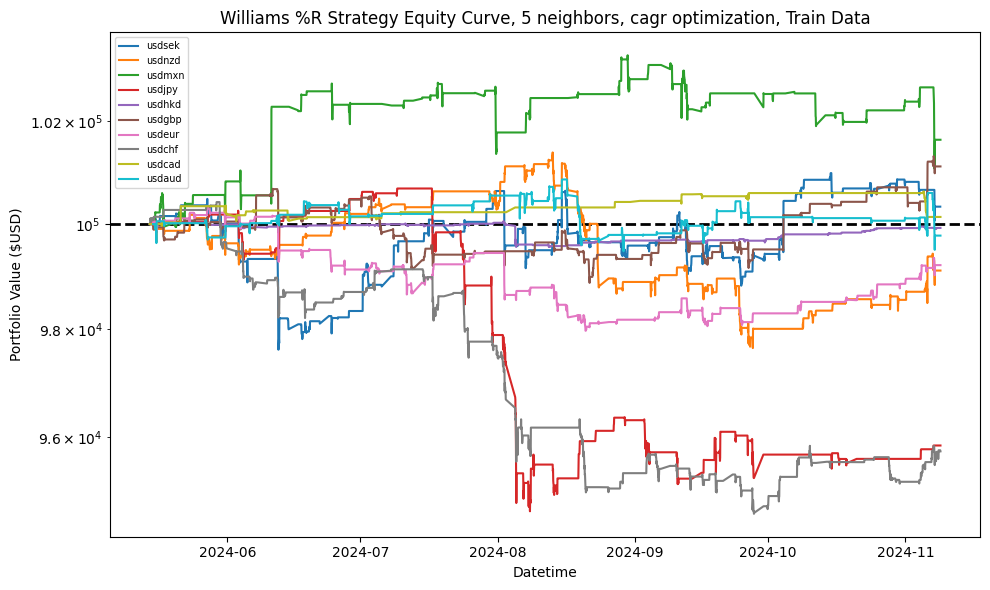

In [81]:
from tqdm import tqdm
from strategy_report import backtest
import utils
import backtrader as bt
import backtrader.analyzers as btanalyzers
from analyzers import InMarketAnalyzer, CashValueAnalyzer, SortinoRatio
from strategies import WilliamsRStrategy, TurnaroundTuesday, CCIStrategy, StochasticStrategy

opt_param = "cagr"
output_folder = "Reports/williamscagr/"
strat = WilliamsRStrategy
strat_name = "Williams %R"

def backtest(data_path, strategy, parameters):
    cerebro = bt.Cerebro(cheat_on_open=True)
    data = utils.YahooFinanceCSVData(
        dataname=data_path, adjclose=True, round=False
    )
    cerebro.adddata(data)

    # Add the WilliamsR strategy
    cerebro.addstrategy(strategy, **parameters)
    cerebro.broker.setcommission(commission=0.0)

    # Set initial capital and broker settings
    # This code was assited using Codeium autocomplete
    cerebro.broker.setcash(100000)
    cerebro.addsizer(bt.sizers.PercentSizer, percents=100)
    cerebro.addanalyzer(btanalyzers.TradeAnalyzer, _name="trade_stats")
    cerebro.addanalyzer(btanalyzers.DrawDown, _name="drawdown")
    cerebro.addanalyzer(btanalyzers.Returns, _name="returns")
    cerebro.addanalyzer(
        bt.analyzers.SharpeRatio,
        _name="sharpe",
        timeframe=bt.TimeFrame.Minutes,  # Timeframe to match hourly data
        compression=60,  # Compression for hourly data (60 minutes)
        riskfreerate=0.01,
    )
    cerebro.addanalyzer(bt.analyzers.TimeReturn, _name="timereturn")
    cerebro.addanalyzer(InMarketAnalyzer, _name="in_market")
    cerebro.addanalyzer(CashValueAnalyzer, _name="cash_value")
    cerebro.addanalyzer(SortinoRatio, _name="sortino")

    results = cerebro.run()

    return results

best_params_df = pd.read_csv(f"{output_folder}/best_parameters.csv")

test_results = {}
best_params_dict = best_params_df.set_index("symbol").to_dict(
    orient="index"
)
for symbol in tqdm(
    best_params_df["symbol"], desc="Backtesting Best Parameters"
):
    test_results[symbol] = backtest(
        f"Data/test/{symbol}_test.csv",
        strat,
        best_params_dict[symbol]
    )

plt.figure(figsize=(10, 6), dpi=100)
plt.axhline(y=100000, color="black", linestyle="--", linewidth=2)

for symbol in test_results.keys():
    equity_curve = test_results[symbol][0].equity_curve
    datetimes = test_results[symbol][0].datetimes
    plt.plot(datetimes, equity_curve, label=f"{symbol}")

# Set the y-ticks and labels
plt.title(
    f"{strat_name} Strategy Equity Curve,"
    + f" 5 neighbors, {opt_param} optimization, Train Data"
)
plt.xlabel("Datetime")
plt.ylabel("Portfolio Value ($USD)")

plt.yscale("log")
plt.legend(fontsize="x-small")
plt.tight_layout()
plt.savefig(f"{output_folder}/test_equity_curve.png")